In [ ]:
!nvidia-smi

Sat Sep  7 02:22:43 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   77C    P0              36W /  70W |   3661MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install flash_attn -q timm -q
!pip install accelerate -q
!pip install einops -q
!pip install -q supervision
!mkdir -p my_models
!mkdir -p my_models/Florence_2

!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt -P my_models/sam2
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_small.pt -P my_models/sam2
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_base_plus.pt -P my_models/sam2
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt -P my_models/sam2

ERROR: Operation cancelled by user
^C


In [ ]:
!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd segment-anything-2
!pip install -e . -q

Cloning into 'segment-anything-2'...
remote: Enumerating objects: 510, done.
remote: Total 510 (delta 0), reused 0 (delta 0), pack-reused 510 (from 1)
Receiving objects: 100% (510/510), 88.46 MiB | 23.12 MiB/s, done.
Resolving deltas: 100% (157/157), done.
/content/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.0 MB/s eta 0:00:00
  Building editable for SAM-2 (pyproject.toml) ... done


In [ ]:
from transformers import AutoModelForCausalLM, AutoProcessor


model = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-large-ft",
                                             cache_dir="/content/my_models/Florence_2",
                                             device_map="cuda",
                                             trust_remote_code=True)

processor = AutoProcessor.from_pretrained("microsoft/Florence-2-large-ft",
                                             cache_dir=f"/content/my_models/Florence_2",
                                             trust_remote_code=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/2.44k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large-ft:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large-ft:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large-ft:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
from PIL import Image
import cv2
import torch
import base64

import numpy as np
import supervision as sv

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

In [ ]:
import cv2
import numpy as np
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import torch

# Assuming Florence 2 model and processor are already imported and initialized
# from florence_model import model, processor

def process_video(video_path):
    video_path = Path(video_path)
    if not video_path.exists():
        raise FileNotFoundError(f"Video file not found: {video_path}")

    cap = cv2.VideoCapture(str(video_path))
    if not cap.isOpened():
        raise ValueError(f"Error: Could not open video {video_path}")

    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    output_path = video_path.with_name(f"{video_path.stem}_processed.mp4")
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(str(output_path), fourcc, fps, (frame_width, frame_height))

    frame_count = 0
    processed_frames = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        processed_frame = process_frame(frame, frame_count)

        processed_frame_bgr = cv2.cvtColor(processed_frame, cv2.COLOR_RGB2BGR)
        out.write(processed_frame_bgr)

        processed_frames.append(processed_frame)
        if len(processed_frames) > 20:
            processed_frames.pop(0)

        frame_count += 1

    cap.release()
    out.release()

    print("Video processing completed.")
    print(f"Total frames processed: {frame_count}")
    print(f"Output video saved to: {output_path}")

    for i, frame in enumerate(processed_frames):
        plt.figure(figsize=(10, 6))
        plt.imshow(frame)
        plt.title(f"Frame {frame_count - len(processed_frames) + i}")
        plt.axis('off')
        plt.show()

def process_frame(frame, frame_count):
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    image = Image.fromarray(frame_rgb)

    persons = detect_persons(image)
    suspicious_behaviors = classify_behaviors(image)

    annotated_frame = annotate_frame(frame_rgb, persons, suspicious_behaviors)

    return annotated_frame

def detect_persons(image):
    PROMPT = "<OD>"
    task_type = "<OD>"

    inputs = processor(text=PROMPT, images=image, return_tensors="pt").to("cuda")

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=2048,
        do_sample=False,
    )
    text_generations = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    results = processor.post_process_generation(text_generations,
                                                task=task_type,
                                                image_size=(image.width, image.height))

    persons = []
    for bbox, label in zip(results[task_type]['bboxes'], results[task_type]['labels']):
        if label == "person":
            persons.append(bbox)

    return persons

def classify_behaviors(image):
    PROMPT = "<CAPTION_TO_PHRASE_GROUNDING> person concealing items, suspicious movements near products, tampering with security tags"
    task_type = "<CAPTION_TO_PHRASE_GROUNDING>"

    inputs = processor(text=PROMPT, images=image, return_tensors="pt").to("cuda")

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=2048,
        do_sample=False,
    )
    text_generations = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    results = processor.post_process_generation(text_generations,
                                                task=task_type,
                                                image_size=(image.width, image.height))

    suspicious_behaviors = []
    for bbox, label in zip(results[task_type]['bboxes'], results[task_type]['labels']):
        if any(keyword in label.lower() for keyword in ['concealing', 'suspicious', 'tampering']):
            suspicious_behaviors.append((bbox, label))

    return suspicious_behaviors

def annotate_frame(frame, persons, suspicious_behaviors):
    annotated = frame.copy()

    # Annotate all detected persons
    for bbox in persons:
        x1, y1, x2, y2 = [int(coord) for coord in bbox]
        cv2.rectangle(annotated, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Annotate suspicious behaviors
    for bbox, label in suspicious_behaviors:
        x1, y1, x2, y2 = [int(coord) for coord in bbox]
        cv2.rectangle(annotated, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(annotated, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    return annotated

# Test the pipeline
if __name__ == "__main__":
    VIDEO_PATH = "/content/gettyimages-1995820194-640_adpp.mp4"
    process_video(VIDEO_PATH)

Video processing completed.
Total frames processed: 658
Output video saved to: /content/gettyimages-1995820194-640_adpp_processed.mp4


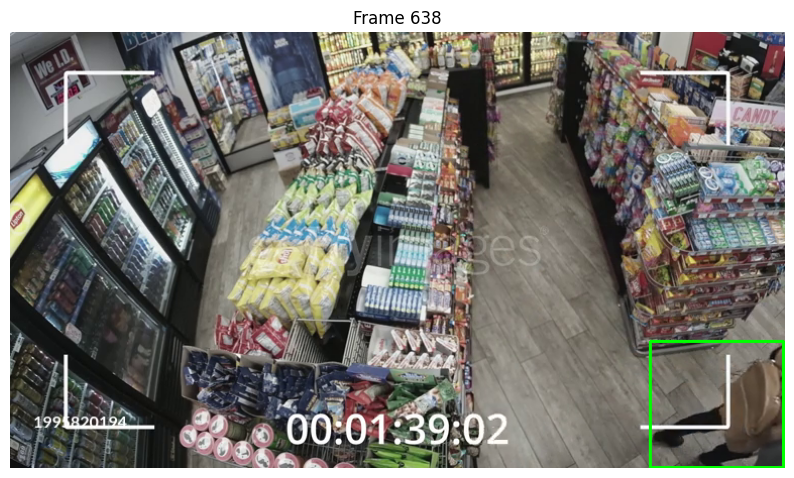

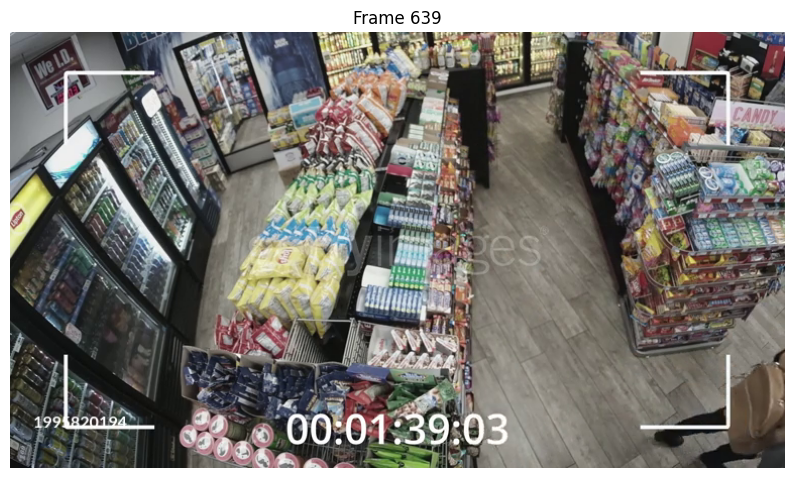

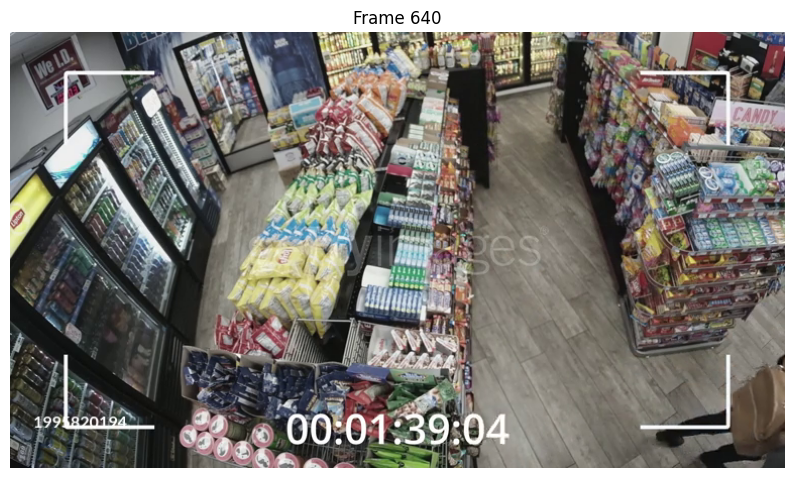

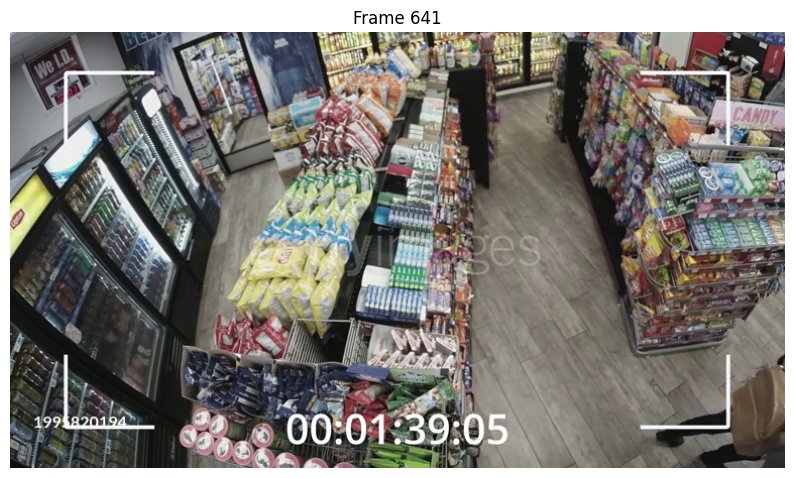

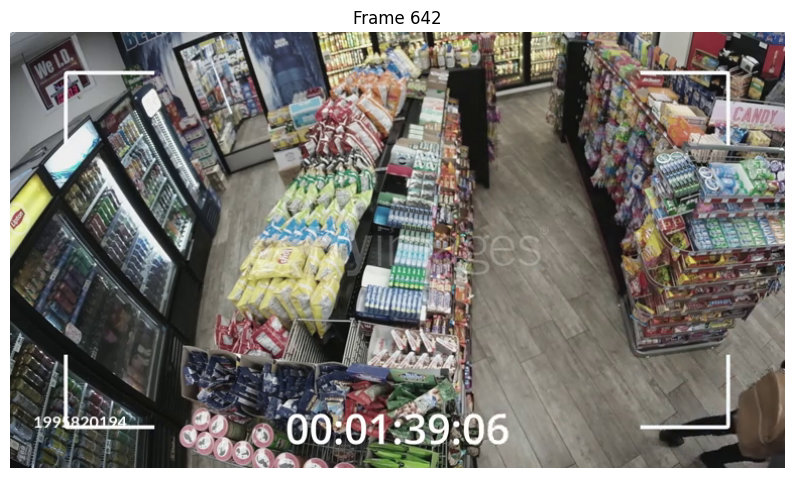

...

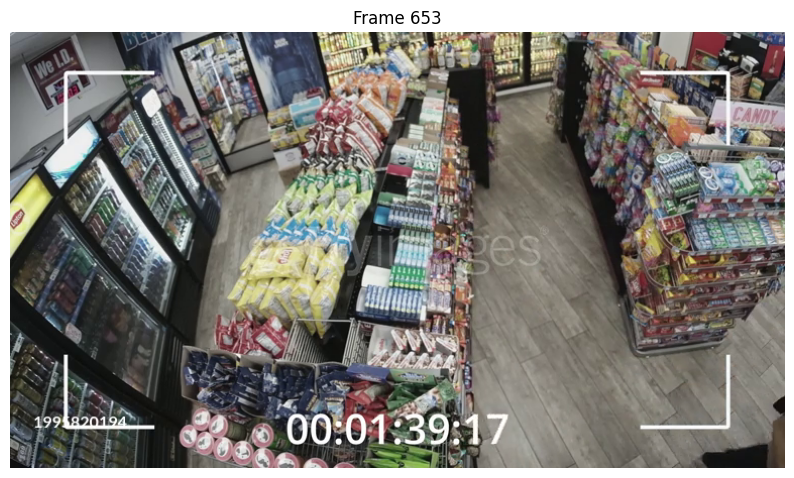

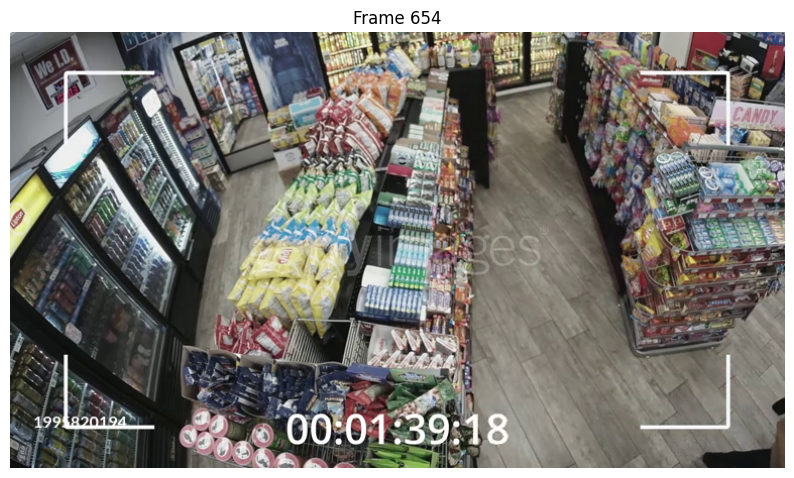

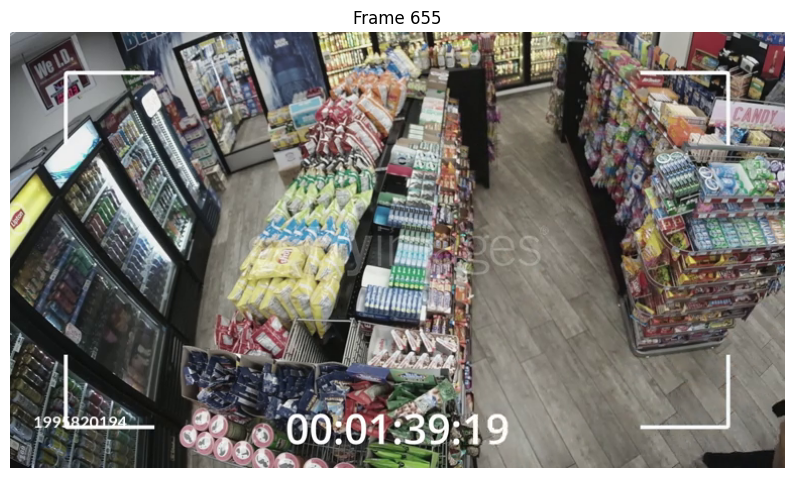

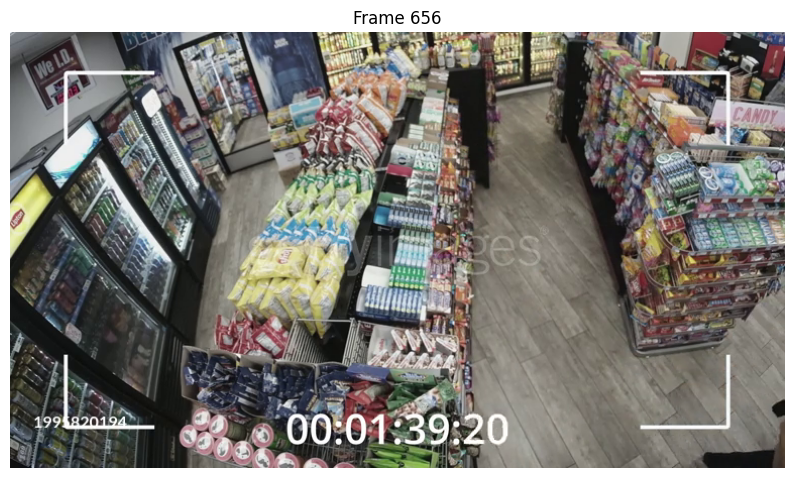

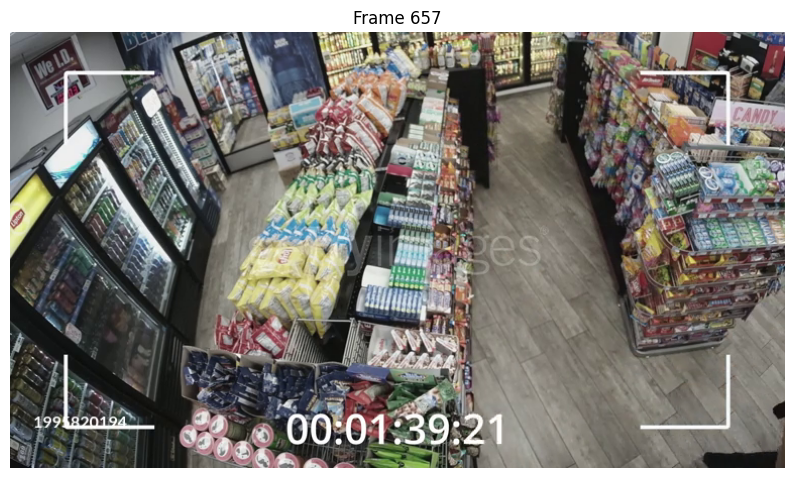

In [ ]:
import cv2
import numpy as np
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import torch

# Assuming Florence 2 model and processor are already imported and initialized
# from florence_model import model, processor

def process_video(video_path):
    video_path = Path(video_path)
    if not video_path.exists():
        raise FileNotFoundError(f"Video file not found: {video_path}")

    cap = cv2.VideoCapture(str(video_path))
    if not cap.isOpened():
        raise ValueError(f"Error: Could not open video {video_path}")

    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    output_path = video_path.with_name(f"{video_path.stem}_processed.mp4")
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(str(output_path), fourcc, fps, (frame_width, frame_height))

    frame_count = 0
    processed_frames = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        processed_frame = process_frame(frame, frame_count)

        processed_frame_bgr = cv2.cvtColor(processed_frame, cv2.COLOR_RGB2BGR)
        out.write(processed_frame_bgr)

        processed_frames.append(processed_frame)
        if len(processed_frames) > 20:
            processed_frames.pop(0)

        frame_count += 1

    cap.release()
    out.release()

    print("Video processing completed.")
    print(f"Total frames processed: {frame_count}")
    print(f"Output video saved to: {output_path}")

    for i, frame in enumerate(processed_frames):
        plt.figure(figsize=(10, 6))
        plt.imshow(frame)
        plt.title(f"Frame {frame_count - len(processed_frames) + i}")
        plt.axis('off')
        plt.show()

def process_frame(frame, frame_count):
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    image = Image.fromarray(frame_rgb)

    persons = detect_persons(image)
    suspicious_behaviors = classify_behaviors(image)

    concealment_detections = []
    for person_bbox in persons:
        items = detect_items_within_bbox(image, person_bbox)
        concealment_areas = detect_concealment_areas(image, person_bbox)

        for item in items:
            if item_concealed(item, concealment_areas):
                concealment_detections.append((person_bbox, item, concealment_areas))

    annotated_frame = annotate_frame(frame_rgb, persons, suspicious_behaviors, concealment_detections)

    return annotated_frame

def detect_persons(image):
    PROMPT = "<OD>"  # This should be the exact prompt expected by the model
    task_type = "<OD>"

    inputs = processor(text=PROMPT, images=image, return_tensors="pt").to("cuda")

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=2048,
        do_sample=False,
    )
    text_generations = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    results = processor.post_process_generation(text_generations,
                                                task=task_type,
                                                image_size=(image.width, image.height))

    persons = []
    for bbox, label in zip(results[task_type]['bboxes'], results[task_type]['labels']):
        if label == "person":
            persons.append(bbox)

    return persons

def detect_items_within_bbox(image, bbox):
    PROMPT = "<OD>"  # Use the same prompt as for person detection
    task_type = "<OD>"

    x1, y1, x2, y2 = [int(coord) for coord in bbox]
    cropped_image = image.crop((x1, y1, x2, y2))

    inputs = processor(text=PROMPT, images=cropped_image, return_tensors="pt").to("cuda")

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=2048,
        do_sample=False,
    )
    text_generations = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    results = processor.post_process_generation(text_generations,
                                                task=task_type,
                                                image_size=(cropped_image.width, cropped_image.height))

    items = []
    for item_bbox, label in zip(results[task_type]['bboxes'], results[task_type]['labels']):
        if label in ["product", "item"]:
            # Adjust bbox coordinates relative to the full image
            adjusted_bbox = [
                item_bbox[0] + x1, item_bbox[1] + y1,
                item_bbox[2] + x1, item_bbox[3] + y1
            ]
            items.append(Item(adjusted_bbox, label))

    return items

def classify_behaviors(image):
    PROMPT = "<CAPTION_TO_PHRASE_GROUNDING>"
    task_type = "<CAPTION_TO_PHRASE_GROUNDING>"

    inputs = processor(text=PROMPT, images=image, return_tensors="pt").to("cuda")

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=2048,
        do_sample=False,
    )
    text_generations = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    results = processor.post_process_generation(text_generations,
                                                task=task_type,
                                                image_size=(image.width, image.height))

    suspicious_behaviors = []
    for bbox, label in zip(results[task_type]['bboxes'], results[task_type]['labels']):
        if any(keyword in label.lower() for keyword in ['concealing', 'suspicious', 'tampering']):
            suspicious_behaviors.append((bbox, label))

    return suspicious_behaviors

def detect_concealment_areas(image, bbox):
    PROMPT = "<CAPTION_TO_PHRASE_GROUNDING>"
    task_type = "<CAPTION_TO_PHRASE_GROUNDING>"

    x1, y1, x2, y2 = [int(coord) for coord in bbox]
    cropped_image = image.crop((x1, y1, x2, y2))

    inputs = processor(text=PROMPT, images=cropped_image, return_tensors="pt").to("cuda")

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=2048,
        do_sample=False,
    )
    text_generations = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    results = processor.post_process_generation(text_generations,
                                                task=task_type,
                                                image_size=(cropped_image.width, cropped_image.height))

    concealment_areas = []
    for area_bbox, label in zip(results[task_type]['bboxes'], results[task_type]['labels']):
        if any(keyword in label.lower() for keyword in ['pocket', 'bag', 'clothing']):
            # Adjust bbox coordinates relative to the full image
            adjusted_bbox = [
                area_bbox[0] + x1, area_bbox[1] + y1,
                area_bbox[2] + x1, area_bbox[3] + y1
            ]
            concealment_areas.append(ConcealmentArea(adjusted_bbox, label))

    return concealment_areas


def detect_concealment_areas(image, bbox):
    PROMPT = "<CAPTION_TO_PHRASE_GROUNDING> pockets, bags, under clothing"
    task_type = "<CAPTION_TO_PHRASE_GROUNDING>"

    x1, y1, x2, y2 = [int(coord) for coord in bbox]
    cropped_image = image.crop((x1, y1, x2, y2))

    inputs = processor(text=PROMPT, images=cropped_image, return_tensors="pt").to("cuda")

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=2048,
        do_sample=False,
    )
    text_generations = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    results = processor.post_process_generation(text_generations,
                                                task=task_type,
                                                image_size=(cropped_image.width, cropped_image.height))

    concealment_areas = []
    for area_bbox, label in zip(results[task_type]['bboxes'], results[task_type]['labels']):
        # Adjust bbox coordinates relative to the full image
        adjusted_bbox = [
            area_bbox[0] + x1, area_bbox[1] + y1,
            area_bbox[2] + x1, area_bbox[3] + y1
        ]
        concealment_areas.append(ConcealmentArea(adjusted_bbox, label))

    return concealment_areas

def item_concealed(item, concealment_areas):
    for area in concealment_areas:
        if bbox_overlap(item.bbox, area.bbox) > 0.5:  # If item overlaps significantly with a concealment area
            return True
    return False

def annotate_frame(frame, persons, suspicious_behaviors, concealment_detections):
    annotated = frame.copy()

    # Annotate all detected persons
    for bbox in persons:
        x1, y1, x2, y2 = [int(coord) for coord in bbox]
        cv2.rectangle(annotated, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Annotate suspicious behaviors
    for bbox, label in suspicious_behaviors:
        x1, y1, x2, y2 = [int(coord) for coord in bbox]
        cv2.rectangle(annotated, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(annotated, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    # Annotate concealment detections
    for person_bbox, item, concealment_areas in concealment_detections:
        for area in concealment_areas:
            if bbox_overlap(item.bbox, area.bbox) > 0.5:
                x1, y1, x2, y2 = [int(coord) for coord in area.bbox]
                cv2.rectangle(annotated, (x1, y1), (x2, y2), (0, 0, 255), 2)  # Red rectangle for concealment area
                cv2.putText(annotated, f"Concealed in {area.label}", (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)

    return annotated

def bbox_overlap(box1, box2):
    # Calculate the overlap ratio between two bounding boxes
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])

    return intersection / (area1 + area2 - intersection)

class Item:
    def __init__(self, bbox, label):
        self.bbox = bbox
        self.label = label

class ConcealmentArea:
    def __init__(self, bbox, label):
        self.bbox = bbox
        self.label = label

# Test the pipeline
if __name__ == "__main__":
    VIDEO_PATH = "/content/gettyimages-1995820194-640_adpp.mp4"
    process_video(VIDEO_PATH)